<a href="https://colab.research.google.com/github/ddfulaa/Machine-Learning-Notes/blob/main/Analysis_of_an_Electric_Power_System_using_Network_Science_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analysis of an Electric Power System using Network Science Notebook

**Disclaimer: This notebook is written exclusively for the author, Daniel, who is a computer scientist and has limited knowledge about the power network context and in general about the network science context. I used ChatGPT for many conceptual issues. The content may contain some naive or potentially incorrect ideas or comments. Therefore, readers are advised to use their discretion when referring to this notebook.**

Welcome to our Jupyter Notebook project that aims to analyze an electric power network using a network science approach. Our goal is to identify key parameters and optimal locations for deploying microgrids within electrical distribution systems.

Basically, we will focus on three main objectives:

1. Identifying the most relevant nodes, known as buses in this context, using centrality measures. By doing this, we want to conduct a vulnerability analysis of the network by removing the most important nodes and assessing how their removal affects network performance. Identifying these nodes is also crucial because we can deploy microgrids near them to improve the network's resilience.
2. Identifying the most relevant edges or links, known as lines and transformers in this context, using edge betweenness measures. Our goal is to conduct a vulnerability analysis of the network by removing the most important edges and assessing how their removal affects network performance.
3. Identifying communities within the network using a community detection algorithm. This can help us understand the structure and function of the network and identify groups of interconnected nodes. These communities can be useful in identifying system vulnerabilities and developing strategies for improving network resilience.

By accomplishing these objectives, we hope to provide valuable insights into the IEEE 118 bus system and enhance the power system's resilience.




## Tools
In our notebook project, we will be using two important libraries: `pandapower` and `networkx`.

The pandapower library will be used to obtain the datasets of the power system network and perform power flow analysis to obtain the network performance. By transforming the bus system into a multigraph in NetworkX, we can use many implemented network algorithms to identify the most relevant nodes and edges in the network. Additionally, pandapower provides a visualization tool that will allow us to visualize the network.

We will also be using Cytoscape 3.9.1 to visualize the centrality measures and communities that we identify in our analysis, because is a more flexible tool than the one provided by pandapower.

In [3]:
!pip install pandapower

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.7/69.7 kB 7.1 MB/s eta 0:00:00
  Created wheel for pandapower: filename=pandapower-2.12.1-py3-none-any.whl size=6260819 sha256=2dc12002affefdc2ca4a2f2920d53a0b3fe9232da634b4be90f192ef16fb2edc
  Stored in directory: /root/.cache/pip/wheels/bb/a1/4d/41eaf5f2a0858980c8a6017c94aebd98efc9c237923bf71d2d
Successfully built pandapower


In [10]:
import pandapower as pp
import pandapower.networks as pn
from pandapower.toolbox import set_element_status, get_connected_elements
from pandapower.plotting.plotly import simple_plotly, pf_res_plotly
from pandapower.topology import create_nxgraph
import plotly.graph_objs as go
import networkx as nx
import pandas as pd
import numpy as np
import copy

print("pandapower version:", pp.__version__)
print("networkx version:", nx.__version__)
print("pandas version:", pd.__version__)
print("numpy version:", np.__version__)

pandapower version: 2.12.1
networkx version: 3.1
pandas version: 1.5.3
numpy version: 1.22.4


## The IEEE 118 Bus System DataSet
The pandapower library includes various test cases, including the IEEE 118 Bus System which is our object of study in this project. We can visualize the network by using the `simple_plotly` method.

### Basic elements of the network

In [3]:
net = pn.case118()
net

This pandapower network includes the following parameter tables:
   - bus (118 element)
   - load (99 element)
   - gen (53 element)
   - shunt (14 element)
   - ext_grid (1 elements)
   - line (173 element)
   - trafo (13 element)
   - poly_cost (54 element)
   - bus_geodata (118 element)

### Visualization with plotly

In [4]:
simple_plotly(net)

### Visualizing the power flow results
We run the power flow analysis with the `runpp` method, and visualize the results by using the `pf_res_plotly`.

In [5]:
pp.runpp(net)
pf_res_plotly(net)

### PandaPower Diagnostic Tool
Pandapower has a diagnostic tool that allow us to see why a power flow does not work well.

In [6]:
pp.diagnostic(net)


_____________ PANDAPOWER DIAGNOSTIC TOOL _____________ 

INFO:pandapower.diagnostic_reports:Checking for missing bus indices...
INFO:pandapower.diagnostic_reports:
INFO:pandapower.diagnostic_reports:PASSED: No missing bus indices found.
 --------

INFO:pandapower.diagnostic_reports:PASSED: No problematic switches found
 --------

INFO:pandapower.diagnostic_reports:PASSED: No connection of different voltage levels found
 --------

INFO:pandapower.diagnostic_reports:PASSED: No elements with impedance values close to zero found...
 --------

INFO:pandapower.diagnostic_reports:PASSED: No components with deviating nominal voltages found
 --------

 --------

INFO:pandapower.diagnostic_reports:PASSED: Power flow converges. No overload found.
 --------

INFO:pandapower.diagnostic_reports:PASSED: No buses with multiple gens and/or ext_grids found.
 --------

INFO:pandapower.diagnostic_reports:PASSED: Power flow converges. Switch configuration seems ok.
 --------

INFO:pandapower.diagnostic_re

{'invalid_values': {'trafo': [(7, 'i0_percent', -0.64444444444444, '>=0'),
   (9, 'i0_percent', -0.81616161616162, '>=0'),
   (11, 'i0_percent', -0.04494949494949, '>=0'),
   (12, 'i0_percent', -0.16565656565657, '>=0')]}}

### Nodes (Buses)
The nodes of the network will be the buses in the power system. But it is important to note that buses could be loads, generators, or a external grid.

In [7]:
net.bus.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 118 entries, 0 to 117
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   name        118 non-null    object 
 1   vn_kv       118 non-null    float64
 2   type        118 non-null    object 
 3   zone        118 non-null    object 
 4   in_service  118 non-null    bool   
 5   max_vm_pu   118 non-null    float64
 6   min_vm_pu   118 non-null    float64
dtypes: bool(1), float64(3), object(3)
memory usage: 10.6+ KB


In [8]:
net.gen.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 0 to 52
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          0 non-null      object 
 1   bus           53 non-null     uint32 
 2   p_mw          53 non-null     float64
 3   vm_pu         53 non-null     float64
 4   sn_mva        0 non-null      float64
 5   min_q_mvar    53 non-null     float64
 6   max_q_mvar    53 non-null     float64
 7   scaling       53 non-null     float64
 8   slack         53 non-null     bool   
 9   in_service    53 non-null     bool   
 10  slack_weight  53 non-null     float64
 11  type          0 non-null      object 
 12  controllable  53 non-null     bool   
 13  max_p_mw      53 non-null     float64
 14  min_p_mw      53 non-null     float64
dtypes: bool(3), float64(9), object(2), uint32(1)
memory usage: 5.3+ KB


In [9]:
net.load.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99 entries, 0 to 98
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             0 non-null      object 
 1   bus              99 non-null     uint32 
 2   p_mw             99 non-null     float64
 3   q_mvar           99 non-null     float64
 4   const_z_percent  99 non-null     float64
 5   const_i_percent  99 non-null     float64
 6   sn_mva           0 non-null      float64
 7   scaling          99 non-null     float64
 8   in_service       99 non-null     bool   
 9   type             0 non-null      object 
 10  controllable     99 non-null     bool   
dtypes: bool(2), float64(6), object(2), uint32(1)
memory usage: 7.5+ KB


In [10]:
net.ext_grid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1 entries, 0 to 0
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          0 non-null      object 
 1   bus           1 non-null      uint32 
 2   vm_pu         1 non-null      float64
 3   va_degree     1 non-null      float64
 4   slack_weight  1 non-null      float64
 5   in_service    1 non-null      bool   
 6   max_p_mw      1 non-null      float64
 7   min_p_mw      1 non-null      float64
 8   max_q_mvar    1 non-null      float64
 9   min_q_mvar    1 non-null      float64
dtypes: bool(1), float64(7), object(1), uint32(1)
memory usage: 77.0+ bytes


### Edges (Lines and Transformers)
The edges or links in this case will be the lines and transformers.

In [11]:
net.line.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 173 entries, 0 to 172
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   name                 0 non-null      object 
 1   std_type             0 non-null      object 
 2   from_bus             173 non-null    uint32 
 3   to_bus               173 non-null    uint32 
 4   length_km            173 non-null    float64
 5   r_ohm_per_km         173 non-null    float64
 6   x_ohm_per_km         173 non-null    float64
 7   c_nf_per_km          173 non-null    float64
 8   g_us_per_km          173 non-null    float64
 9   max_i_ka             173 non-null    float64
 10  df                   173 non-null    float64
 11  parallel             173 non-null    uint32 
 12  type                 173 non-null    object 
 13  in_service           173 non-null    bool   
 14  max_loading_percent  173 non-null    float64
dtypes: bool(1), float64(8), object(3), uint3

In [12]:
net.trafo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13 entries, 0 to 12
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   name                 0 non-null      object 
 1   std_type             0 non-null      object 
 2   hv_bus               13 non-null     uint32 
 3   lv_bus               13 non-null     uint32 
 4   sn_mva               13 non-null     float64
 5   vn_hv_kv             13 non-null     float64
 6   vn_lv_kv             13 non-null     float64
 7   vk_percent           13 non-null     float64
 8   vkr_percent          13 non-null     float64
 9   pfe_kw               13 non-null     float64
 10  i0_percent           13 non-null     float64
 11  shift_degree         13 non-null     float64
 12  tap_side             9 non-null      object 
 13  tap_neutral          9 non-null      float64
 14  tap_min              0 non-null      float64
 15  tap_max              0 non-null      float

The results of the power flow are stored in the `res_"component"` attribute of the network. For example:

In [13]:
net.res_bus.iloc[68,:]

vm_pu          1.035000
va_degree     30.000000
p_mw        -513.907463
q_mvar        82.460152
Name: 68, dtype: float64

In [14]:
net.res_line.head()

,p_from_mw,q_from_mvar,p_to_mw,q_to_mvar,pl_mw,ql_mvar,i_from_ka,i_to_ka,i_ka,vm_from_pu,va_from_degree,vm_to_pu,va_to_degree,loading_percent
0,-12.352813,-13.041199,12.450421,11.006364,0.097607,-2.034835,0.078692,0.071572,0.078692,0.955000,10.972367,0.971393,11.512175,0.189993
1,-38.647187,-17.062898,38.897280,16.884898,0.250094,-0.177999,0.185074,0.183328,0.185074,0.955000,10.972367,0.967692,11.855817,0.446838
2,-103.229741,-26.791947,103.430631,27.492803,0.200890,0.700856,0.447085,0.446862,0.447085,0.998000,15.573717,1.001985,16.018806,1.079430
3,-68.110506,-14.488880,69.348980,17.283518,1.238474,2.794638,0.301056,0.298418,0.301056,0.967692,11.855817,1.001985,16.018806,0.726863
4,88.470412,4.106446,-87.539927,-1.298722,0.930485,2.807724,0.369798,0.369981,0.369981,1.001985,16.018806,0.990000,13.291499,0.893272


### Functions to modify the 'in_service' property

In order to perform the vulnerability analysis using the runpp method, we need a way to disable certain nodes and links in the power system network. To do this, we can modify the `in_service` attribute of our network components.

The pandapower library provides a convenient method called `set_element_status` that allows us to disable a node and all the links connected to it. However, for disabling lines and trafos, we define our own method since pandapower does not provide a built-in method for this. It's important to exercise caution when using these methods because they modify the network in place. 

In [12]:
# Line
def set_line_status(net, line_idxs, in_service):
  net.line.loc[line_idxs, "in_service"] = in_service
  return net

# Trafo
def set_trafo_status(net, trafo_idxs, in_service):
  net.trafo.loc[trafo_idxs, "in_service"] = in_service
  return net

Let's for example disable the bus 100, and the line 0. Note we have to use the index 99, because the buses are enumerated from 1 to 118, but the indexes start from 0.

In [16]:
net.bus.loc[99,:]

name            100
vn_kv         138.0
type              b
zone            1.0
in_service     True
max_vm_pu      1.06
min_vm_pu      0.94
Name: 99, dtype: object

In [17]:
net.line.loc[0,:]

name                         None
std_type                     None
from_bus                        0
to_bus                          1
length_km                     1.0
r_ohm_per_km             5.770332
x_ohm_per_km            19.024956
c_nf_per_km            353.789081
g_us_per_km                   0.0
max_i_ka                41.418606
df                            1.0
parallel                        1
type                           ol
in_service                   True
max_loading_percent         100.0
Name: 0, dtype: object

In [18]:
set_element_status(net,[99],False)
set_line_status(net,[0],False)
net.bus.loc[99,:]

name            100
vn_kv         138.0
type              b
zone            1.0
in_service    False
max_vm_pu      1.06
min_vm_pu      0.94
Name: 99, dtype: object

In [19]:
net.line.loc[0,:]

name                         None
std_type                     None
from_bus                        0
to_bus                          1
length_km                     1.0
r_ohm_per_km             5.770332
x_ohm_per_km            19.024956
c_nf_per_km            353.789081
g_us_per_km                   0.0
max_i_ka                41.418606
df                            1.0
parallel                        1
type                           ol
in_service                  False
max_loading_percent         100.0
Name: 0, dtype: object

We could visualize the effect of disabling these components

In [20]:
pp.runpp(net)
pf_res_plotly(net)

Notice that when we disable a node, the runpf result will be a NaN value, but when we disable a link, the result will be 0.

In [21]:
net.res_bus.loc[99,:]

vm_pu        NaN
va_degree    NaN
p_mw         0.0
q_mvar       0.0
Name: 99, dtype: float64

In [22]:
net.res_line.loc[0,:]

p_from_mw           0.000000
q_from_mvar         0.000000
p_to_mw             0.000000
q_to_mvar           0.000000
pl_mw               0.000000
ql_mvar             0.000000
i_from_ka           0.000000
i_to_ka             0.000000
i_ka                0.000000
vm_from_pu          0.955000
va_from_degree     10.225279
vm_to_pu            0.980950
va_to_degree       12.063986
loading_percent     0.000000
Name: 0, dtype: float64

## From `PandaPower` to `NetworkX`
Now, let's see how to work with NetworkX by using a PandaPower dataset. Pandapower provides the method `create_nxgraph`, which will be a multigraph. But in our case we really care if it is a directed graph or not, so we have to convert it into a multidirected graph.

In [23]:
net = pp.networks.case118()
G = create_nxgraph(net)

In [24]:
list(G.nodes)[0:5]

[0, 1, 2, 3, 4]

In [25]:
list(G.edges)[0:5]

[(0, 1, ('line', 0)),
 (0, 2, ('line', 1)),
 (1, 11, ('line', 11)),
 (2, 4, ('line', 3)),
 (2, 11, ('line', 12))]

We now can calculate some centrality measures. All the information below can be found on NetworkX documentation [NetworkX documentation](https://networkx.org/documentation/stable/reference/algorithms/centrality.html)

* closeness_centrality(G, u=None, distance=None, wf_improved=True): Compute closeness centrality for nodes.
Closeness centrality of a node u is the reciprocal of the average shortest path distance to u over all n-1 reachable nodes.
* current_flow_closeness_centrality(G, weight=None, dtype=<class 'float'>, solver='lu'): Compute current-flow closeness centrality for nodes. Current-flow closeness centrality is variant of closeness centrality based on effective resistance between nodes in a network. This metric is also known as information centrality.
* betweenness_centrality(G, k=None, normalized=True, weight=None, endpoints=False, seed=None): Compute the shortest-path betweenness centrality for nodes.
* edge_betweenness_centrality(G, k=None, normalized=True, weight=None, seed=None): Compute betweenness centrality for edges.
* current_flow_betweenness_centrality: Current-flow betweenness centrality uses an electrical current model for information spreading in contrast to betweenness centrality which uses shortest paths. Current-flow betweenness centrality is also known as random-walk betweenness centrality


* voterank(G, number_of_nodes=None): Select a list of influential nodes in a graph using VoteRank algorithm. VoteRank computes a ranking of the nodes in a graph G based on a voting scheme. With VoteRank, all nodes vote for each of its in-neighbours and the node with the highest votes is elected iteratively. The voting ability of out-neighbors of elected nodes is decreased in subsequent turns.

* laplacian_centrality(G, normalized=True, nodelist=None, weight='weight', walk_type=None, alpha=0.95): Compute the Laplacian centrality for nodes in the graph G. The Laplacian Centrality of a node i is measured by the drop in the Laplacian Energy after deleting node i from the graph. The Laplacian Energy is the sum of the squared eigenvalues of a graph’s Laplacian matrix.


We also could calculate the PageRank
* pagerank(G, alpha=0.85, personalization=None, max_iter=100, tol=1e-06, nstart=None, weight='weight', dangling=None) : Returns the PageRank of the nodes in the graph. PageRank computes a ranking of the nodes in the graph G based on the structure of the incoming links. It was originally designed as an algorithm to rank web pages.

And some community detection algorithms:
* k_clique_communities(G, k, cliques=None): Find k-clique communities in graph using the percolation method.

* louvain_communities(G, weight='weight', resolution=1, threshold=1e-07, seed=None): Find the best partition of a graph using the Louvain Community Detection Algorithm. Louvain Community Detection Algorithm is a simple method to extract the community structure of a network. This is a heuristic method based on modularity optimization.

* girvan_newman(G, most_valuable_edge=None): Finds communities in a graph using the Girvan–Newman method. The Girvan–Newman algorithm detects communities by progressively removing edges from the original graph. The algorithm removes the “most valuable” edge, traditionally the edge with the highest betweenness centrality, at each step. As the graph breaks down into pieces, the tightly knit community structure is exposed and the result can be depicted as a dendrogram.




### Computing Node Centralities

In [27]:
node_centralities = pd.DataFrame()
node_centralities['closeness'] = pd.DataFrame.from_dict(nx.closeness_centrality(G), orient='index', columns=['closeness']).sort_index()
node_centralities['betweenness'] = pd.DataFrame.from_dict(nx.betweenness_centrality(G), orient='index', columns=['betweenness']).sort_index()
node_centralities['pagerank'] = pd.DataFrame.from_dict(nx.pagerank(G), orient='index', columns=['pagerank']).sort_index()
node_centralities['degree_centrality'] = pd.DataFrame.from_dict(nx.degree_centrality(G), orient='index', columns=['degree_centrality']).sort_index()
node_centralities['load_centrality'] = pd.DataFrame.from_dict(nx.load_centrality(G), orient='index', columns=['load_centrality']).sort_index()
node_centralities['harmonic_centrality'] = pd.DataFrame.from_dict(nx.harmonic_centrality(G), orient='index', columns=['harmonic_centrality']).sort_index()
node_centralities['current_flow_closeness'] = pd.DataFrame.from_dict(nx.current_flow_closeness_centrality(G), orient='index', columns=['current_flow_closeness']).sort_index()
node_centralities['laplacian_centrality'] = pd.DataFrame.from_dict(nx.laplacian_centrality(G), orient='index', columns=['laplacian_centrality']).sort_index()
node_centralities['current_flow_betwenness'] = pd.DataFrame.from_dict(nx.current_flow_betweenness_centrality(G), orient='index', columns=['current_flow_betweenness']).sort_index()

voterank = nx.voterank(G)
print(f'Nodes importance by voterank:\n{voterank}')
node_centralities.head()


Nodes importance by voterank:
[48, 79, 99, 11, 58, 36, 16, 91, 69, 4, 31, 84, 76, 104, 109, 14, 64, 26, 55, 95, 33, 88, 61, 22, 45, 29, 39, 70, 74, 18, 50, 67, 8, 10, 20, 53, 93, 0, 28, 43, 60, 82, 85, 5, 23, 24, 34, 41, 49, 51, 63, 65, 75, 77, 89, 100, 105, 107, 113, 68, 102]


,closeness,betweenness,pagerank,degree_centrality,load_centrality,harmonic_centrality,current_flow_closeness,laplacian_centrality,current_flow_betwenness
0,0.120494,0.000270,0.006753,0.017094,0.000295,18.700089,0.002903,0.009019,0.013531
1,0.125268,0.002650,0.006674,0.017094,0.002700,20.296084,0.003012,0.013529,0.015370
2,0.136523,0.015573,0.009203,0.025641,0.015462,22.713811,0.003399,0.021421,0.038416
3,0.134328,0.000000,0.006310,0.017094,0.000000,21.032859,0.003194,0.012401,0.014355
4,0.151751,0.068034,0.011900,0.042735,0.068797,25.232828,0.003742,0.023675,0.095618


### Computing Edge Centrality

In [28]:
edge_centralities = pd.DataFrame()
edge_centralities['edge_betweenness'] = pd.DataFrame.from_dict(nx.edge_betweenness_centrality(G), orient='index', columns=['edge_betweenness']).sort_index()
edge_centralities.head()

,edge_betweenness
"(0, 1, (line, 0))",0.003016
"(0, 2, (line, 1))",0.014464
"(1, 11, (line, 11))",0.019144
"(2, 4, (line, 3))",0.024589
"(2, 11, (line, 12))",0.008515


In [29]:
list(edge_centralities.sort_values(by='edge_betweenness', ascending=False).index)

[(37, 64, ('line', 89)),
 (68, 76, ('line', 109)),
 (29, 37, ('line', 49)),
 (64, 67, ('trafo', 7)),
 (48, 68, ('line', 97)),
 (67, 80, ('trafo', 9)),
 (79, 80, ('trafo', 10)),
 (23, 69, ('line', 99)),
 (22, 23, ('line', 28)),
 (76, 81, ('line', 116)),
 (7, 29, ('line', 33)),
 (68, 69, ('line', 98)),
 (79, 98, ('line', 140)),
 (79, 97, ('line', 139)),
 (16, 29, ('trafo', 2)),
 (81, 82, ('line', 117)),
 (98, 99, ('line', 146)),
 (97, 99, ('line', 145)),
 (99, 102, ('line', 150)),
 (4, 7, ('trafo', 0)),
 (36, 37, ('trafo', 3)),
 (68, 67, ('trafo', 8)),
 (22, 31, ('line', 37)),
 (82, 84, ('line', 119)),
 (76, 79, ('line', 114)),
 (76, 79, ('line', 113)),
 (102, 109, ('line', 161)),
 (15, 16, ('line', 20)),
 (64, 65, ('trafo', 6)),
 (74, 76, ('line', 110)),
 (69, 74, ('line', 105)),
 (79, 95, ('line', 135)),
 (63, 64, ('line', 90)),
 (93, 95, ('line', 137)),
 (39, 41, ('line', 52)),
 (11, 15, ('line', 18)),
 (48, 50, ('line', 66)),
 (36, 39, ('line', 48)),
 (91, 99, ('line', 141)),
 (32, 3

### Computing Communities

In [30]:
# run the Louvain community detection algorithm
louvain_communities = nx.community.louvain_communities(G)
louvain_partitions = nx.community.louvain_partitions(G) 
#k_clique = nx.community.k_clique_communities(G2,3) #Not implemented for digraphs
modular = nx.community.greedy_modularity_communities(G)
centrality_communities = nx.community.girvan_newman(G) # This returns a generator. When cast to list, each element is a possible partition? of the list of nodes.
#for community in centrality_communities:
#    print(len(community))
#nx.community.label_propagation_communities(G2) #Not implemented for digraphs
asyn_lpa_communities = nx.community.asyn_lpa_communities(G)


### General measures of the network

In [31]:
avg_path_length = nx.average_shortest_path_length(G)
density = nx.density(G)
diameter = nx.diameter(G)
print(f'Average Path Lenght:\t\t{avg_path_length}')
print(f'Density:\t\t\t{density}')
print(f'Diameter:\t\t\t{diameter}')

Average Path Lenght:		6.308706359553817
Density:			0.026944806605823556
Diameter:			14


## Vulnerability Analysis Approaches


### Considerations - Why network connectivity is important in power networks

The connectivity of a power network is crucial to ensure its stability and reliability. When a group of nodes in a power network becomes disconnected from the main grid, an island is formed. This can lead to power outages, damage to electrical equipment, and other reliability issues. To prevent these negative consequences, power systems are designed with redundancy and backup mechanisms that can restore power quickly to disconnected nodes.

Equipment failure or other disturbances can cause a portion of the network to become disconnected and form islands. To avoid islands, microgrids and distributed energy resources (DERs) can be deployed near nodes that are most likely to become disconnected. These can provide a local source of power that can help to maintain power supply in the event of an island. Moreover, islanding detection mechanisms can be used to quickly detect and isolate the disconnected nodes to prevent instability in the rest of the power network.

### Approaches suggested by professor (mentioned by Manuel)
To measure the importance of the links (lines) in an electric network, you can use the following metrics:

* Edge betweenness centrality: It is similar to node betweenness centrality, but applied to links instead of nodes. Links with high edge betweenness centrality are critical for maintaining connectivity and energy flow in the network. If they are disconnected, they can cause significant disruptions.

* Power flow in the lines: Analyzing the power flow in the lines can help identify which links are more critical in terms of transport capacity and load in the network. Links with high load may be more susceptible to failures and have a greater impact in case of disconnection.

To determine the best locations to place a microgrid, you can consider the following criteria:

* Proximity to critical nodes: Placing a microgrid near nodes with high betweenness centrality or eigenvector centrality can improve the resilience and stability of the system by providing an alternative energy source in case of main grid failures.

* Areas with high energy demand: Placing a microgrid in areas with high energy demand can help reduce the load on the main grid and improve energy efficiency.

* Redundancy of the network: Implementing microgrids in areas with high redundancy (high clustering coefficient) can increase the resilience of the network, as microgrids can provide energy to neighboring nodes in case of main grid failures.

### Node approach (ChatGPT suggestion)

To measure the vulnerability of the network based on node betweenness, you can use several approaches:

* **Node removal**: You can simulate the removal of nodes from the network based on their betweenness scores. Start by removing the node with the highest betweenness score, and then measure the impact on the network's connectivity. Repeat this process for other high-scoring nodes and measure the impact each time. The nodes that have the greatest impact on the network's connectivity are the most vulnerable. It's important to note that in this approach, you do not restore the nodes after removing them. Each time you remove a node, you are changing the network's topology, and subsequent removals are based on the updated topology.

* **Robustness analysis**: You can measure the robustness of the network by calculating the fraction of nodes that need to be removed in order to fragment the network into disconnected components. Nodes with high betweenness scores are more likely to be critical connectors in the network, so removing them will have a greater impact on the network's robustness.

* **Resilience analysis**: You can measure the resilience of the network by calculating the average shortest path length between all pairs of nodes before and after node removal. Nodes with high betweenness scores are more likely to be on the shortest paths between many pairs of nodes, so removing them will increase the average shortest path length and decrease the network's resilience.

Notes: 
* Is it really necessary to calculate a centrality measure like the betweenness? 
Calculating the betweenness centrality provides a way to prioritize which nodes to remove first in a systematic and efficient manner. By ranking the nodes based on their betweenness scores, we can focus on removing the most critical nodes first, which are likely to have the greatest impact on the network's connectivity.
If we were to simply remove each node one by one and measure the impact each time, we would need to test all possible combinations of nodes, which would quickly become computationally infeasible as the network size increases. The betweenness centrality provides a way to identify the most important nodes without needing to test all possible combinations, allowing us to perform the node removal analysis in a more efficient and systematic way.
* Why the betweenness centrality? Could I use another centrality measure? In addition to betweenness centrality, other centrality measures that can be used to analyze the vulnerability of the network's connectivity include: 
* * Closeness centrality: This measures how close a node is to all other nodes in the network. Nodes with high closeness centrality are critical for maintaining short paths between other nodes.

* * Eigenvector centrality: This measures a node's influence based on the influence of its neighbors. Nodes with high eigenvector centrality are connected to other important nodes and can have a large impact on the network's connectivity.

* * PageRank centrality: This measures a node's importance based on the number and importance of its neighbors. Nodes with high PageRank centrality are highly connected to other important nodes and can be critical for maintaining the network's connectivity.

* * Degree centrality: This measures the number of connections that a node has in the network. Nodes with high degree centrality are highly connected and can be critical for maintaining the network's connectivity.

 Different centrality measures can provide different insights into the network's structure and vulnerabilities. It is often useful to consider multiple centrality measures in combination to get a more comprehensive understanding of the network.
* If you disconnect some nodes and the network splits into two functional subnetworks, then you have created what is commonly known as a "network partition". A network partition occurs when a network is divided into two or more disconnected subnetworks, each of which has no direct communication with the others. In the case of a power network, a network partition can result in the formation of islands, which can cause instability and reliability issues, as mentioned before.

 When a network partition occurs, the nodes and links within each subnetwork can still function normally, but they cannot communicate with nodes in other subnetworks. This can lead to problems if there are nodes in one subnetwork that require power from a node in another subnetwork. If the connection between those nodes is lost due to the network partition, the nodes in the first subnetwork may experience a loss of power.

 In general, network partitions are not desirable in power networks, as they can lead to power outages and other reliability issues. Therefore, power systems are typically designed with redundancy and backup mechanisms that can help to prevent network partitions and quickly restore power to disconnected nodes if a partition does occur.


### Daniel's Notes:
* If we use only network science approch feels like if we are losing relevant information in our application. I could think some ways to include the use of the power flow implemented in Pandapower. For example, we could measure the vulnerability of a node by removing it, running and running the power flow. In some cases, as in the removal of the node 100 in our example, other nodes are disconnected in consequence. We could count the number of nodes disconnected as consequence of the removal of each node to give us a measure of the importance of the node. We could assing to each node a weight depending on the power consumed/generated by each node or a weight for a link depending upon the current it carries. This network is small, so we could simulate the failure of each node separately and measure the impact in each case. **I would like to use the nodes centralities information and the vulnerability of each node calculated as mentioned before for developing a machine learning  solution in order to predict the vulnerability of a node based on the centrality measures. This would be useful, because it would be a nice way to avoid the simulation of the removal of each node in power networks with much many nodes, which could be expensive in terms of computation. May be I need any other information as the limits for each node and the actual value of each node after running the power flow.**
* We could try to use the information of the nodes, such as the max and min voltage, and the voltage after the simulation, in addition to centrality measures to rank the importance of the node. We could use other information as the power loss, power generated, power consumed or something similar.

### Edge approach (ChatGPT suggestion)
To measure the vulnerability of the network based on edge betweenness, you can use several approaches:

* **Edge removal**: You can simulate the removal of edges from the network based on their betweenness scores. Start by removing the edge with the highest betweenness score, and then measure the impact on the network's connectivity. Repeat this process for other high-scoring edges and measure the impact each time. The edges that have the greatest impact on the network's connectivity are the most vulnerable.

* **Robustness analysis**: You can measure the robustness of the network by calculating the fraction of edges that need to be removed in order to fragment the network into disconnected components. Edges with high betweenness scores are more likely to be critical connectors in the network, so removing them will have a greater impact on the network's robustness.

* **Resilience analysis**: You can measure the resilience of the network by calculating the average shortest path length between all pairs of nodes before and after edge removal. Edges with high betweenness scores are more likely to be on the shortest paths between many pairs of nodes, so removing them will increase the average shortest path length and decrease the network's resilience.

### Communities approach (ChatGPT suggestion)

**Note** I will not do this analysis, I just put it here just for reference.

To measure the vulnerability of the network based on community detection, you can use several approaches:

* **Community removal**: You can simulate the removal of communities from the network based on their size or density. Start by removing the largest or densest community, and then measure the impact on the network's connectivity. Repeat this process for other high-scoring communities and measure the impact each time. The communities that have the greatest impact on the network's connectivity are the most vulnerable.

* **Robustness analysis**: You can measure the robustness of the network by calculating the fraction of nodes or edges that need to be removed in order to fragment the network into disconnected components. Communities with high internal connectivity are less vulnerable to fragmentation, so identifying these communities can help prioritize efforts to protect the network.

* **Resilience analysis**: You can measure the resilience of the network by calculating the average shortest path length between all pairs of nodes before and after community removal. Communities that are highly connected to other communities are more likely to be on the shortest paths between many pairs of nodes, so removing them will increase the average shortest path length and decrease the network's resilience.

### Communities and microgrids (ChatGPT)
Using a community detection approach to identify where to locate microgrids could be a promising strategy. Community detection algorithms aim to identify densely connected groups of nodes within a network, which can help to reveal underlying structures and patterns in the data.

By applying a community detection algorithm to a power network, we can identify clusters of nodes that are more closely connected to each other than to nodes in other clusters. These clusters may correspond to geographic regions, areas with similar demand profiles, or other meaningful partitions of the network.

Once we have identified the communities within the network, we can then consider locating microgrids within or near these communities. This can help to improve the resiliency of the power network by providing local sources of power that can support critical nodes or clusters in the event of an outage.

Of course, community detection algorithms are not perfect and may not always identify the optimal locations for microgrids. Additionally, the placement of microgrids must consider a variety of factors, including the availability of resources, land use regulations, and other practical considerations. Nonetheless, using community detection to guide microgrid placement is an interesting and potentially valuable approach to explore.

## Node Vulnerability Analysis - Execution

### Node's relevance (Daniel's perspective)
In this section, I will use the betweenness centrality, and many other metrics to analyze the vulnerability of the power system. Betweenness centrality is a network science concept that quantifies how often a node acts as a bridge along the shortest paths between other nodes. In the context of power systems, this means how often a bus is involved in transferring power from one part of the system to another. A bus with high betweenness centrality is more critical for maintaining the connectivity and functionality of the system.

However, betweenness centrality is not the only factor that determines the impact of removing a bus from the system. Other aspects, such as the generation and consumption of power at each bus, also affect the system performance and stability. For instance, removing a generator bus can cause power deficits and voltage drops, while removing a load bus can reduce the power demand and relieve the stress on transmission lines.

Moreover, removing the external grid bus is not a realistic scenario because it represents the connection to the higher level grid that provides the reference for voltage and frequency in the system. Without the external grid, the system would not be able to operate normally.

Therefore, I propose the following measure to evaluate the vulnerability of each bus in the system:
$$\text{importance}(\text{bus}_i) = \text{ne} * bc * (1-\sigma(np)),$$
where $ne$ is 1 when the node is not the external grid and 0 if does, $bc$ is the betweenness centrality of the node, and $np$ is a normalized value of the power demand. $\sigma$ is the sigmoid function.

In [32]:
def sigmoid(x):
  return 1/(1+np.exp(-x))

In [33]:
def make_node_vulnerability_experiment(net, compute_importance_list_fn):
  G = create_nxgraph(net)
  pp.runpp(net)
  importance_list = compute_importance_list_fn(net, G)
  net_aux=copy.deepcopy(net)
  external_nodes = list(net.ext_grid['bus'])
  important_nodes=[]
  for node_index in importance_list:
    if node_index not in external_nodes:
      set_element_status(net_aux,[node_index],False)
      important_nodes.append(node_index)
      try:
        pp.runpp(net_aux) 
      except:
        break 
  
  return len(net.bus)-net_aux.bus['in_service'].sum(), important_nodes, pp.diagnostic(net_aux, report_style='None')

def make_node_vulnerability_experiment_considering_topology(net, compute_importance_list_fn):
  G = create_nxgraph(net)
  pp.runpp(net)
  importance_list = compute_importance_list_fn(net,G)
  
  external_nodes = list(net.ext_grid['bus'])
  net_aux=copy.deepcopy(net)
  important_nodes=[]
  while True:
    i=0
    node_index = importance_list[i]
    while node_index in external_nodes and i<=net.bus.shape[0]:
      i += 1
      node_index = importance_list[i]
    try:
      important_nodes.append(node_index)
      set_element_status(net_aux,[node_index],False)
      pp.runpp(net_aux)
      G.remove_node(node_index)
      importance_list = compute_importance_list_fn(net_aux,G)
    except:
      break

  return len(net.bus)-net_aux.bus['in_service'].sum(), important_nodes, pp.diagnostic(net_aux, report_style='None')

def node_vulnerability_experiment(net, fn, print_results=True, considering_topology=False):
  net.trafo.loc[:, "i0_percent"] = np.abs(net.trafo.loc[:, "i0_percent"])
  if considering_topology:
    res = make_node_vulnerability_experiment_considering_topology(net, compute_importance(fn[0], fn[1]))
  else:
    res = make_node_vulnerability_experiment(net, compute_importance(fn[0],fn[1]))
  if print_results:
    print(f'It is necessary to remove {res[0]} nodes to make the network fails.')
    print(f'The most important nodes were {res[1]}.')
  return res

def vulnerability_experiments_with_different_measures(net, measures, considering_topology=False):
  node_vulnerability_results=dict()
  print('NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES')
  for cm, fn in measures.items():
    print('***'+cm.upper()+'***')
    res = node_vulnerability_experiment(net, fn, print_results=True, considering_topology=considering_topology)
    node_vulnerability_results[cm] = res
    print('')
  return node_vulnerability_results


In [34]:
def compute_importance(fn, is_centrality_measure):
  if is_centrality_measure:
    def cm_fn(net, G):
      return list(pd.DataFrame.from_dict(fn(G), orient='index', columns=['cm']).sort_values(by='cm',ascending=False).index)
    return cm_fn
  else:
    return fn

def compute_importance_power(net, G):
  return list((1-sigmoid(net.res_bus['p_mw']/net.res_bus['p_mw'].max())).sort_values(ascending=False).index)

def compute_importance_own(centrality_measure_fn):
  def fn(net,G):
    df = pd.DataFrame()
    df['centrality_measure'] = pd.DataFrame.from_dict(centrality_measure_fn(G), orient='index', columns=['centrality_measure']).sort_index()
    df['centrality_measure'] = df['centrality_measure'].apply(lambda x: x/df['centrality_measure'].max())
    df['power_demand'] = net.res_bus['p_mw']/net.res_bus['p_mw'].max()
    df['power_demand'] = df['power_demand'].apply(lambda x: 1-sigmoid(x)) 
    df.loc[list(net.ext_grid['bus']),:]=0
    df['importance'] = df['centrality_measure']*df['power_demand']
    return list(df.importance.sort_values(ascending=False).index)
  return fn


In [35]:
# Dictionary whose keys are measures and values are tuples which first component is the function and  the second one is a boolean value that tell us if it is a centrality measure
centrality_measures = {
    'closeness' : (nx.closeness_centrality, True),
    'betweenness' : (nx.betweenness_centrality, True),
    'pagerank' : (nx.pagerank,True),
    'degree_centrality' : (nx.degree_centrality,True),
    'load_centrality' : (nx.load_centrality,True),
    'harmonic_centrality' : (nx.harmonic_centrality,True),
    'current_flow_closeness' : (nx.current_flow_closeness_centrality,True),
    #'laplacian_centrality' : (nx.laplacian_centrality,True), #Computationally too expensive!!!!
    'current_flow_betwenness' : (nx.current_flow_betweenness_centrality,True),
}

own_measures = dict()
for key, value in centrality_measures.items():
  own_measures['OWN_'+key] = (compute_importance_own(value[0]), False)

#### Centrality measures

In [36]:
simple_centrality_results = vulnerability_experiments_with_different_measures(pp.networks.case118(), centrality_measures, considering_topology=False)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***CLOSENESS***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [67, 64, 48].

***BETWEENNESS***
It is necessary to remove 5 nodes to make the network fails.
The most important nodes were [76, 64, 79, 37, 48].

***PAGERANK***
It is necessary to remove 12 nodes to make the network fails.
The most important nodes were [48, 11, 99, 79, 76, 91, 88, 31, 16, 14, 84, 36].

***DEGREE_CENTRALITY***
It is necessary to remove 9 nodes to make the network fails.
The most important nodes were [48, 79, 99, 76, 91, 11, 58, 16, 36].

***LOAD_CENTRALITY***
It is necessary to remove 5 nodes to make the network fails.
The most important nodes were [76, 64, 79, 37, 48].

***HARMONIC_CENTRALITY***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [48, 76, 64].

***CURRENT_FLOW_CLOSENESS***
It is necessary to remove 3 nodes to make the network fails.
The most important no

#### Power demand
Let's try by using only the power demand as the important factor to determine the importance of a node.

In [37]:
simple_power_results = vulnerability_experiments_with_different_measures(pp.networks.case118(), {'POWER DEMAND':(compute_importance_power,False)}, considering_topology=False)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***POWER DEMAND***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [88, 9, 64].



By using these approach, we can notice that the external grid node is really important, because appears in the top 10 of important nodes in the two previous metrics. However, as mentioned before, it must not be removed.

#### Our approach
Now, let's do the same analysis but using the proposed approach.

In [38]:
simple_own_results = vulnerability_experiments_with_different_measures(pp.networks.case118(), own_measures, considering_topology=False)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***OWN_CLOSENESS***
It is necessary to remove 2 nodes to make the network fails.
The most important nodes were [64, 65].

***OWN_BETWEENNESS***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [64, 79, 48].

***OWN_PAGERANK***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [48, 99, 79, 88].

***OWN_DEGREE_CENTRALITY***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [48, 79, 99, 88].

***OWN_LOAD_CENTRALITY***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [64, 79, 48].

***OWN_HARMONIC_CENTRALITY***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [64, 79, 65].

***OWN_CURRENT_FLOW_CLOSENESS***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [64, 79, 65].

***OWN_CURRENT_FLOW_B

### Node removal affects the topology of the network
When one node is removed, the topology of the network changes, resulting in a different network, so the betweenness values could change, changing in consequence the importance of the nodes after the removal. The problem with this approach is that is more expensive, because the recalculation of the betweenness of all the remaining nodes. Let's explore this approach and begin by considering only the node betweenness.

#### Centrality measures

In [39]:
top_centrality_results = vulnerability_experiments_with_different_measures(pp.networks.case118(), centrality_measures, considering_topology=True)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***CLOSENESS***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [67, 48, 22].

***BETWEENNESS***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [76, 67, 48, 37].

***PAGERANK***
It is necessary to remove 9 nodes to make the network fails.
The most important nodes were [48, 11, 99, 79, 91, 104, 109, 55, 84].

***DEGREE_CENTRALITY***
It is necessary to remove 8 nodes to make the network fails.
The most important nodes were [48, 99, 79, 58, 11, 91, 36, 16].

***LOAD_CENTRALITY***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [76, 67, 48, 37].

***HARMONIC_CENTRALITY***
It is necessary to remove 2 nodes to make the network fails.
The most important nodes were [48, 64].

***CURRENT_FLOW_CLOSENESS***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [48, 76, 67].

***

We can notice that considering the change of the topology makes the number of removals decrease, and thus allow us to concentrate only on really important nodes.

#### Power demand

In [40]:
top_power_results = vulnerability_experiments_with_different_measures(pp.networks.case118(), {'POWER DEMAND':(compute_importance_power,False)}, considering_topology=True)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***POWER DEMAND***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [88, 9, 64].



#### Our approach

In [41]:
top_own_results = vulnerability_experiments_with_different_measures(pp.networks.case118(), own_measures, considering_topology=True)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***OWN_CLOSENESS***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [64, 79, 65].

***OWN_BETWEENNESS***
It is necessary to remove 2 nodes to make the network fails.
The most important nodes were [64, 48].

***OWN_PAGERANK***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [48, 79, 99, 88].

***OWN_DEGREE_CENTRALITY***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [48, 79, 99, 88].

***OWN_LOAD_CENTRALITY***
It is necessary to remove 2 nodes to make the network fails.
The most important nodes were [64, 48].

***OWN_HARMONIC_CENTRALITY***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [64, 79, 65].

***OWN_CURRENT_FLOW_CLOSENESS***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [64, 79, 65].

***OWN_CURRENT_FLOW_BETWE

### Test in another network (Not important for results)
Let's try with a bigger network. This grid represents a part of the European high voltage transmission network. We will not pretend to study this network, and it is shown here only to demonstrates that study big networks could be a very hard task.

In [42]:
net = pn.case1354pegase()
net

This pandapower network includes the following parameter tables:
   - bus (1354 element)
   - load (621 element)
   - sgen (52 element)
   - gen (259 element)
   - shunt (1082 element)
   - ext_grid (1 elements)
   - line (1751 element)
   - trafo (240 element)
   - poly_cost (260 element)
   - bus_geodata (1354 element)

Betweenness - Simple

In [43]:
pp.runpp(net)
pf_res_plotly(net)

In [44]:
aux1 = vulnerability_experiments_with_different_measures(pn.case1354pegase(), centrality_measures, considering_topology=False)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***CLOSENESS***
It is necessary to remove 20 nodes to make the network fails.
The most important nodes were [395, 684, 902, 936, 497, 318, 148, 460, 654, 692, 482, 759, 996, 1207, 1093, 1137, 1079, 1221, 131, 96].

***BETWEENNESS***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [497, 395, 1006].

***PAGERANK***
It is necessary to remove 6 nodes to make the network fails.
The most important nodes were [801, 1329, 787, 305, 1255, 134].

***DEGREE_CENTRALITY***
It is necessary to remove 1 nodes to make the network fails.
The most important nodes were [134].

***LOAD_CENTRALITY***
It is necessary to remove 3 nodes to make the network fails.
The most important nodes were [497, 395, 1006].

***HARMONIC_CENTRALITY***
It is necessary to remove 20 nodes to make the network fails.
The most important nodes were [395, 497, 684, 936, 902, 482, 318, 460, 148, 1207, 654, 692, 759, 1093, 5, 996, 208, 11

Power - Simple

In [45]:
aux2 = vulnerability_experiments_with_different_measures(pn.case1354pegase(), {'POWER DEMAND':(compute_importance_power,False)}, considering_topology=False)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***POWER DEMAND***
It is necessary to remove 9 nodes to make the network fails.
The most important nodes were [812, 996, 1062, 759, 117, 1202, 177, 1153, 808].



Our approach - Simple

In [46]:
aux3 = vulnerability_experiments_with_different_measures(pn.case1354pegase(), own_measures, considering_topology=False)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***OWN_CLOSENESS***
It is necessary to remove 10 nodes to make the network fails.
The most important nodes were [996, 1062, 759, 812, 523, 577, 843, 180, 151, 1153].

***OWN_BETWEENNESS***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [497, 759, 395, 1006].

***OWN_PAGERANK***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [1329, 787, 801, 134].

***OWN_DEGREE_CENTRALITY***
It is necessary to remove 1 nodes to make the network fails.
The most important nodes were [134].

***OWN_LOAD_CENTRALITY***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [497, 759, 395, 1006].

***OWN_HARMONIC_CENTRALITY***
It is necessary to remove 9 nodes to make the network fails.
The most important nodes were [996, 759, 1062, 812, 523, 497, 577, 843, 180].

***OWN_CURRENT_FLOW_CLOSENESS***
It is necessary to remove 9 nodes to

Betweenness - Recomputing

In [47]:
aux4 = vulnerability_experiments_with_different_measures(pn.case1354pegase(), centrality_measures, considering_topology = True)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***CLOSENESS***
It is necessary to remove 11 nodes to make the network fails.
The most important nodes were [395, 684, 460, 148, 96, 520, 497, 482, 131, 578, 858].

***BETWEENNESS***
It is necessary to remove 5 nodes to make the network fails.
The most important nodes were [497, 148, 96, 193, 1006].

***PAGERANK***
It is necessary to remove 6 nodes to make the network fails.
The most important nodes were [801, 1329, 787, 305, 1255, 134].

***DEGREE_CENTRALITY***
It is necessary to remove 1 nodes to make the network fails.
The most important nodes were [134].

***LOAD_CENTRALITY***
It is necessary to remove 5 nodes to make the network fails.
The most important nodes were [497, 148, 96, 193, 1006].

***HARMONIC_CENTRALITY***
It is necessary to remove 11 nodes to make the network fails.
The most important nodes were [395, 684, 460, 482, 148, 954, 578, 833, 96, 497, 778].

***CURRENT_FLOW_CLOSENESS***
It is necessary to remove 2 nodes 

Power - Recomputing

In [48]:
aux5 = vulnerability_experiments_with_different_measures( pn.case1354pegase(), {'POWER DEMAND':(compute_importance_power,False)}, considering_topology=True)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***POWER DEMAND***
It is necessary to remove 9 nodes to make the network fails.
The most important nodes were [812, 996, 1062, 759, 117, 1202, 177, 1153, 808].



Our approach - Recomputing

In [49]:
aux6 =  vulnerability_experiments_with_different_measures(pn.case1354pegase(), own_measures, considering_topology=True)

NODE VULNERABILITY EXPERIMENTS WITH DIFFERENT MEASURES
***OWN_CLOSENESS***
It is necessary to remove 10 nodes to make the network fails.
The most important nodes were [996, 1062, 759, 812, 523, 577, 151, 843, 180, 1153].

***OWN_BETWEENNESS***
It is necessary to remove 5 nodes to make the network fails.
The most important nodes were [497, 148, 96, 1062, 1006].

***OWN_PAGERANK***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [1329, 787, 801, 134].

***OWN_DEGREE_CENTRALITY***
It is necessary to remove 1 nodes to make the network fails.
The most important nodes were [134].

***OWN_LOAD_CENTRALITY***
It is necessary to remove 4 nodes to make the network fails.
The most important nodes were [497, 936, 96, 1062].

***OWN_HARMONIC_CENTRALITY***
It is necessary to remove 10 nodes to make the network fails.
The most important nodes were [996, 759, 1062, 812, 523, 577, 180, 843, 151, 1153].

***OWN_CURRENT_FLOW_CLOSENESS***
It is necessary to remove

### Node importance by considering only the pandapower analysis

Let's compute how many buses stop to demanding power or is disconnected

In [50]:
net = pn.case118()
df = pd.DataFrame()
df['number_of_not_working_buses'] = net.bus['max_vm_pu'].apply(lambda x: 0)
df['number_of_not_demanding'] = net.bus['max_vm_pu'].apply(lambda x: 0)
pp.runpp(net)
mask = (np.isnan(net.res_bus['vm_pu']))| ((net.res_bus['q_mvar'] == 0) & (net.res_bus['p_mw'] == 0) )
print(f'Number of buses with no power demand without removing any bus:{net.res_bus[mask].shape[0]}')
print(f'The no demanding power buses are {list(net.res_bus[mask].index)}')
for ii in net.bus.index:
  set_element_status(net,[ii],False)
  try:
    pp.runpp(net)
    mask1 = (np.isnan(net.res_bus['vm_pu']))
    mask2 =  ((net.res_bus['q_mvar'] == 0) & (net.res_bus['p_mw'] == 0) )
    df['number_of_not_working_buses'].loc[ii] = net.res_bus[mask1].shape[0]
    df['number_of_not_demanding'].loc[ii] = net.res_bus[mask2].shape[0]
  except:
    df['number_of_not_working_buses'].loc[ii] = net.bus.shape[0]
    df['number_of_not_demanding'].loc[ii] = net.bus.shape[0]
  set_element_status(net,[ii],True)

print(df.sort_values(by='number_of_not_demanding', ascending=False))
#list(df.sort_values(by='number_of_not_working_buses', ascending=False).index)[0:10]

Number of buses with no power demand without removing any bus:8
The no demanding power buses are [8, 29, 37, 62, 63, 67, 70, 80]
     number_of_not_working_buses  number_of_not_demanding
68                           118                      118
99                            11                       19
109                            3                       11
84                             3                       11
85                             2                       10
7                              3                       10
11                             2                       10
78                             1                        9
79                             1                        9
81                             1                        9
0                              1                        9
82                             1                        9
76                             1                        9
83                             1                        9
8

### Conclusions

Generalities:
* Studying larger networks can be a challenging task, especially when using computationally expensive metrics like Laplacian centrality.
* Choosing the right metric for a specific problem may not always be obvious, and using multiple metrics is important to gain a comprehensive understanding of the network's topology.
* It's worth noting that removing a node changes the network topology, and taking this into account can result in identifying more critical nodes with fewer removals, leading to a better assessment of node importance.

IEEE 118 Bus System:
* Based on the analysis, node 49 (index 48) can be considered one of the most important nodes as it appears in almost all measurements.
* Surprisingly, node 65 (index 64) is a generator bus and is also considered important with other centrality measurements.
* The original network has 8 nodes with no power demand.  These nodes are [9, 30, 38, 63, 64, 68, 71, 81]
* When the nodes 81,38,64,63,30 are disconnected, one of the original nodes with no power demand activates.
* Node 100 is also identified as important by some centrality measures. Moreover, disconnecting it causes 10 other buses disconnect (So in total there are 19 buses with load 0).
* Incorporating additional information about the network, such as the power demand of each bus, into centrality metrics can significantly reduce the number of node removals required.

## Edge Vulnerability Analysis - Execution

In [41]:

def make_animation(net, net_list, animation_time):
  # Generate the initial Plotly object
  fig = pf_res_plotly(net)

  # Create an empty list to hold the frames of the animation
  frames = []
  modifications = net_list
  # Assume `new_net` is the modified network
  # Loop through the modifications and generate a new frame for each one
  for i, new_net in enumerate(modifications):
      # Generate the Plotly object for the modified network
      new_fig = pf_res_plotly(new_net)

      # Add the new frame to the list of frames
      frames.append(go.Frame(data=new_fig.data, layout=new_fig.layout, name=str(i)))

  # Add the frames to the animation
  fig.frames = frames

  # Specify the animation settings
  animation_settings = dict(frame=dict(duration=animation_time, redraw=True), fromcurrent=True)
  fig.update_layout(updatemenus=[dict(type='buttons', showactive=False,
                                    buttons=[dict(label='Play',
                                                  method='animate',
                                                  args=[None, animation_settings])])])

  # Show the animation
  fig.show()


### Simple analysis with the Edge Betweenness
Let's consider a simple analysis of the edges, by calculating the edge betwenness once and removing the edges with bigger values.

In [8]:
def get_edge_importance_list_by_edge_betweenness(net):
  G = create_nxgraph(net)
  edge_centralities = pd.DataFrame()
  edge_centralities['edge_betweenness'] = pd.DataFrame.from_dict(nx.edge_betweenness_centrality(G), orient='index', columns=['edge_betweenness']).sort_index()
  return list(edge_centralities.sort_values(by='edge_betweenness', ascending=False).index)


In [13]:
net = pn.case118()
importance_list = get_edge_importance_list_by_edge_betweenness(net)
# List to store the removed edges
important_edges = [] 
# List to store the modified nets for making the animation
net_list=[]

for edge in importance_list:
  important_edges.append(edge)
  net_list.append(copy.deepcopy(net))
  if edge[2][0]=='line':
    set_line_status(net,[edge[2][1]],False)
  else:
    set_trafo_status(net,[edge[2][1]],False)
  try: 
    pp.runpp(net)
  except:
    res = pp.diagnostic(net, report_style='None')
    break

important_edges

[(37, 64, ('line', 89)),
 (68, 76, ('line', 109)),
 (29, 37, ('line', 49)),
 (64, 67, ('trafo', 7)),
 (48, 68, ('line', 97)),
 (67, 80, ('trafo', 9)),
 (79, 80, ('trafo', 10)),
 (23, 69, ('line', 99)),
 (22, 23, ('line', 28)),
 (76, 81, ('line', 116)),
 (7, 29, ('line', 33)),
 (68, 69, ('line', 98)),
 (79, 98, ('line', 140)),
 (79, 97, ('line', 139)),
 (16, 29, ('trafo', 2)),
 (81, 82, ('line', 117)),
 (98, 99, ('line', 146)),
 (97, 99, ('line', 145)),
 (99, 102, ('line', 150)),
 (4, 7, ('trafo', 0))]

In [54]:
make_animation(pn.case118(),net_list, 300)

### Considering the change of the topology


In [14]:
net = pn.case118()
importance_list = get_edge_importance_list_by_edge_betweenness(net)
# List to store the removed edges
important_edges = [] 
# List to store the modified nets for making the animation
net_list=[]

while len(importance_list)>0:
  edge = importance_list[0]
  important_edges.append(edge) 
  net_list.append(copy.deepcopy(net))
  if edge[2][0]=='line':
    set_line_status(net,[edge[2][1]],False)
  else:
    set_trafo_status(net,[edge[2][1]],False)
  try:
    pp.runpp(net)
    importance_list = get_edge_importance_list_by_edge_betweenness(net)
  except:
    res = pp.diagnostic(net, report_style='None')
    break

print(res)
important_edges[0:10]

{'disconnected_elements': [{'buses': [97], 'loads': [79]}, {'buses': [98], 'loads': [80], 'gens': [42]}, {'buses': [7, 8, 9], 'lines': [6, 7], 'loads': [6], 'gens': [3, 4]}, {'buses': [80]}], 'invalid_values': {'trafo': [(7, 'i0_percent', -0.64444444444444, '>=0'), (9, 'i0_percent', -0.81616161616162, '>=0'), (11, 'i0_percent', -0.04494949494949, '>=0'), (12, 'i0_percent', -0.16565656565657, '>=0')]}, 'overload': {'load': True, 'generation': True}, 'wrong_switch_configuration': False}


[(37, 64, ('line', 89)),
 (68, 76, ('line', 109)),
 (74, 76, ('line', 110)),
 (67, 80, ('trafo', 9)),
 (74, 117, ('line', 171)),
 (36, 39, ('line', 48)),
 (22, 23, ('line', 28)),
 (36, 38, ('line', 47)),
 (33, 42, ('line', 55)),
 (48, 68, ('line', 97)),
 (46, 68, ('line', 96)),
 (64, 67, ('trafo', 7)),
 (99, 102, ('line', 150)),
 (99, 103, ('line', 151)),
 (99, 105, ('line', 154)),
 (7, 29, ('line', 33)),
 (15, 16, ('line', 20)),
 (14, 16, ('line', 19)),
 (14, 18, ('line', 24)),
 (32, 36, ('line', 44)),
 (44, 48, ('line', 63)),
 (44, 45, ('line', 57)),
 (81, 82, ('line', 117)),
 (84, 88, ('line', 123)),
 (87, 88, ('line', 124)),
 (93, 95, ('line', 137)),
 (91, 99, ('line', 141)),
 (91, 93, ('line', 132)),
 (92, 93, ('line', 133)),
 (99, 100, ('line', 147)),
 (16, 17, ('line', 21)),
 (29, 37, ('line', 49)),
 (21, 22, ('line', 27)),
 (39, 41, ('line', 52)),
 (40, 41, ('line', 53)),
 (4, 7, ('trafo', 0)),
 (48, 50, ('line', 66)),
 (52, 53, ('line', 69)),
 (55, 57, ('line', 77)),
 (75, 76,

In [17]:
print(f'Then number of removed edges is {len(important_edges)}.')

Then number of removed edges is 186.


In this case, the analysis indicates that considering the change in network topology by removing an edge may not be useful. Although removing the most important edge each time did not cause the network to stop working, this approach may not always be reliable as a simple analysis suggests that the network may still fail even after removing important edges.

### Anaylsis with the loading percent
Links that carry a high load may be more prone to failure and can have a significant impact if they become disconnected. Therefore, it is advisable to take into account the `loading_percent` property in the `res_line` and `res_trafo` after performing the power flow analysis.
However, it is important to note that in this particular network, the `loading_percent` property maintains low values, reducing the likelihood of failure due to overloading.

In [27]:
# As we need to consider two kinds of edges, we combine it into a dictionary
def get_edge_importance_list_by_loading_percent(net):
  #pp.runpp(net)
  dic = dict()
  for i,j in net.res_line.loading_percent.items():
    dic[('line',i)] = j
  for i,j in net.res_trafo.loading_percent.items():
    dic[('trafo',i)] = j
  sorted_dict = dict(sorted(dic.items(), key=lambda x: x[1], reverse=True))
  return list(sorted_dict.keys())

In [39]:
net = pn.case118()
net.trafo.loc[:, "i0_percent"] = np.abs(net.trafo.loc[:, "i0_percent"])
pp.runpp(net)
importance_list = get_edge_importance_list_by_loading_percent(net)
important_edges = []
net_list=[]
diag_list=[]
for edge in importance_list:
  important_edges.append(edge)
  
  if edge[0]=='line':
    set_line_status(net,[edge[1]],False)
  else:
    set_trafo_status(net,[edge[1]],False)
  try:
    pp.runpp(net)
    net_list.append(copy.deepcopy(net))
    diag_list.append(pp.diagnostic(net, report_style='None'))
  except:
    res = pp.diagnostic(net, report_style='None')
    break
important_edges

[('line', 6),
 ('line', 7),
 ('trafo', 0),
 ('trafo', 12),
 ('trafo', 3),
 ('trafo', 2),
 ('line', 34)]

In [42]:
make_animation(pn.case118(),net_list, 1000)

In [24]:
net_list[-1].bus

,name,vn_kv,type,zone,in_service,max_vm_pu,min_vm_pu
0,1,138.0,b,1.0,True,1.06,0.94
1,2,138.0,b,1.0,True,1.06,0.94
2,3,138.0,b,1.0,True,1.06,0.94
3,4,138.0,b,1.0,True,1.06,0.94
4,5,138.0,b,1.0,True,1.06,0.94
5,6,138.0,b,1.0,True,1.06,0.94
6,7,138.0,b,1.0,True,1.06,0.94
7,8,345.0,b,1.0,True,1.06,0.94
8,9,345.0,b,1.0,True,1.06,0.94
9,10,345.0,b,1.0,True,1.06,0.94


In [26]:
diag_list[-1]

{'disconnected_elements': [{'buses': [115], 'loads': [96], 'gens': [52]},
  {'buses': [8]},
  {'buses': [9], 'gens': [4]}]}

Interestingly, this approach lead the network stop of working with less removed edges than the simple analysis with the edge betweenness.

It is also important to notice that some voltages in the buses are below the minimum values, some of them reaching 0.76 pu! Since  we are using runpp instead of runopp, the analysis allow those values. Let's check what happens when runopp is used.

### Analysis with runopp

In [29]:
net = pn.case118()
net.trafo.loc[:, "i0_percent"] = np.abs(net.trafo.loc[:, "i0_percent"])
pp.runopp(net)
importance_list = get_edge_importance_list_by_loading_percent(net)
important_edges = []
net_list=[]
diag_list=[]
for edge in importance_list:
  important_edges.append(edge)
  if edge[0]=='line':
    set_line_status(net,[edge[1]],False)
  else:
    set_trafo_status(net,[edge[1]],False)
  try:
    pp.runopp(net)
    net_list.append(copy.deepcopy(net))
    diag_list.append(pp.diagnostic(net, report_style='None'))
  except:
    res = pp.diagnostic(net, report_style='None')
    break
len(important_edges)

64

In [33]:
make_animation(net, net_list, 500)

### Conclusions
The edge vulnerability analysis is harder to interpret in this particular case, because the loading percents keeps relatively low values. However it is important to note that some buses have lower voltages, which may cause the devices connected to them do not work properly. 
It was observed that when runopp is used, the power flow is more resilent to disconnections, but so many buses low near to their top values.

## Community approach

We will use cytoscape for this approach. In order to use Cytoscape with Google Colab we need:
1. Install CytoScape in our computer (3.9.1 or superior)
2. Run the following cell

In [43]:
import requests
exec(requests.get("https://raw.githubusercontent.com/cytoscape/jupyter-bridge/master/client/p4c_init.py").text)
IPython.display.Javascript(_PY4CYTOSCAPE_BROWSER_CLIENT_JS) # Start browser client

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

Collecting py4cytoscape

Downloading py4cytoscape-1.7.0-py3-none-any.whl (177 kB)

Output()

Requirement already satisfied: decorator in /usr/local/lib/python3.10/dist-packages (from py4cytoscape) (4.4.2)

Requirement already satisfied: pandas in /usr/local/lib/python3.10/dist-packages (from py4cytoscape) (1.5.3)

Collecting colorbrewer

Downloading colorbrewer-0.2.0-py3-none-any.whl (9.4 kB)

Requirement already satisfied: chardet in /usr/local/lib/python3.10/dist-packages (from py4cytoscape) (4.0.0)

Collecting python-igraph

Downloading python-igraph-0.10.4.tar.gz (9.5 kB)

Preparing metadata (setup.py): started

Preparing metadata (setup.py): finished with status 'done'

Collecting backoff

Downloading backoff-2.2.1-py3-none-any.whl (15 kB)

Requirement already satisfied: requests in /usr/local/lib/python3.10/dist-packages (from py4cytoscape) (2.27.1)

Requirement already satisfied: networkx in /usr/local/lib/python3.10/dist-packages (from py4cytoscape) (3.1)

Collecting colour

Downloading colour-0.1.5-py2.py3-none-any.whl (23 kB)

Requirement already satisfied: six in /usr/local/lib/python3.10/dist-packages (from colorbrewer->py4cytoscape) (1.16.0)

Requirement already satisfied: numpy>=1.21.0 in /usr/local/lib/python3.10/dist-packages (from pandas->py4cytoscape) (1.22.4)

Requirement already satisfied: pytz>=2020.1 in /usr/local/lib/python3.10/dist-packages (from pandas->py4cytoscape) (2022.7.1)

Requirement already satisfied: python-dateutil>=2.8.1 in /usr/local/lib/python3.10/dist-packages (from pandas->py4cytoscape) (2.8.2)

Collecting igraph==0.10.4

Downloading igraph-0.10.4-cp39-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.3 MB)

Output()

Collecting texttable>=1.6.2

Downloading texttable-1.6.7-py2.py3-none-any.whl (10 kB)

Requirement already satisfied: charset-normalizer~=2.0.0 in /usr/local/lib/python3.10/dist-packages (from requests->py4cytoscape) (2.0.12)

Requirement already satisfied: certifi>=2017.4.17 in /usr/local/lib/python3.10/dist-packages (from requests->py4cytoscape) (2022.12.7)

Requirement already satisfied: idna<4,>=2.5 in /usr/local/lib/python3.10/dist-packages (from requests->py4cytoscape) (3.4)

Requirement already satisfied: urllib3<1.27,>=1.21.1 in /usr/local/lib/python3.10/dist-packages (from requests->py4cytoscape) (1.26.15)

Building wheels for collected packages: python-igraph

Building wheel for python-igraph (setup.py): started

Building wheel for python-igraph (setup.py): finished with status 'done'

Created wheel for python-igraph: filename=python_igraph-0.10.4-py3-none-any.whl size=9073 sha256=6485befe801ac3276ee8f844ed3419ebf80d282926246aba68f6bb5fcdcbd1d4

Stored in directory: /root/.cache/pip/wheels/49/27/15/dcf90953e3e3322e6f3e447514b20cf39b53c6518cb4a7bace

Successfully built python-igraph

Installing collected packages: texttable, colour, igraph, colorbrewer, backoff, python-igraph, py4cytoscape

Successfully installed backoff-2.2.1 colorbrewer-0.2.0 colour-0.1.5 igraph-0.10.4 py4cytoscape-1.7.0 python-igraph-0.10.4 texttable-1.6.7

Loading Javascript client ... ddd25d7f-be7e-4b9a-b530-2fb209b0c7ed on https://jupyter-bridge.cytoscape.org
ADVICE: WHEN RUNNING UNDER COLAB, DO NOT RE-RUN THIS CELL WITHOUT MANUALLY EXECUTING Runtime | Factory Reset Runtime FROM THE COLAB MENU FIRST.


<IPython.core.display.Javascript object>

 **Note:** It is necessary to run Cytoscape in our computer before continuing running the following cells

 The next cell verifies that everything is working well.

In [44]:
import py4cytoscape as p4c
p4c.cytoscape_ping()
p4c.cytoscape_version_info()

You are connected to Cytoscape!


{'apiVersion': 'v1',
 'cytoscapeVersion': '3.9.1',
 'automationAPIVersion': '1.7.0',
 'py4cytoscapeVersion': '1.7.0',
 'jupyterBridgeVersion': '0.0.2'}

Instead of using pandapower, we will use pypower because it allows to export easily the power network as nodes and edges tables.

In [46]:
!pip install pypower

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 347.0/347.0 kB 6.7 MB/s eta 0:00:00


In [49]:
import pypower.api as pyp
import pandas as pd

case118 = pyp.case118()

## bus data
#bus_i type Pd Qd Gs Bs area Vm Va baseKV zone Vmax Vmin 
bus_df = pd.DataFrame(case118['bus'], columns=['bus_i', 'type', 'Pd', 'Qd', 'Gs', 'Bs', 'area', 'Vm', 'Va', 'baseKV', 'zone', 'Vmax', 'Vmin' ])
bus_df['id'] = bus_df['bus_i'].astype('int').astype('str') #Al parecer la versión de py4cytoscape maneja los ids como strings, quizá por su infuencia de la biología computacional

## branch data 
# fbus, tbus, r, x, b, rateA, rateB, rateC, ratio, angle, status, angmin, angmax 
branch_df=pd.DataFrame(case118['branch'],columns=['fbus', 'tbus', 'r', 'x', 'b', 'rateA', 'rateB', 'rateC', 'ratio', 'angle', 'status', 'angmin', 'angmax'])
branch_df['source']=branch_df['fbus'].astype('int').astype('str') ##Al parecer la versión de py4cytoscape maneja los ids como strings, quizá por su infuencia de la biología computacional
branch_df['target']=branch_df['tbus'].astype('int').astype('str') ##Al parecer la versión de py4cytoscape maneja los ids como strings, quizá por su infuencia de la biología computacional
branch_df['interaction']='' # Columna para py4cytoscape

#bus_df.to_csv('bus.csv',index=False)
#branch_df.to_csv('branch.csv',index=False)

Now we can load the network to CytoScape

In [50]:
p4c.create_network_from_data_frames(bus_df, branch_df, title="IEEE 118 Bus System", collection="Final Project - NS4DA")

Applying default style...
Applying preferred layout


5125

We can visualize what is shown in the current view of Cytoscape by running the following code

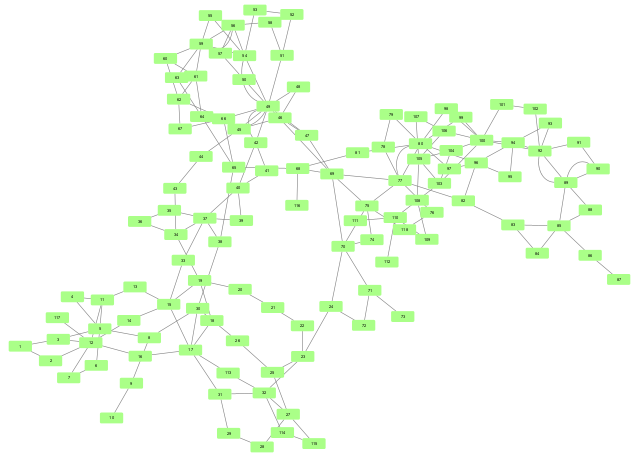

In [51]:
p4c.notebook_export_show_image()

The next part will be executed all in Cytoscape, because I don't know how to do it from here, but in summary I will perform:
* A basic analysis of the network (Tools menu > Analyze Network > Check the analyze as a directed graph). Now in the node table and edge table appears new information related to the network, as the centrality measures.
* an use of the Moduland App, which allow us to identify the communities by using the EdgeBetweenness.

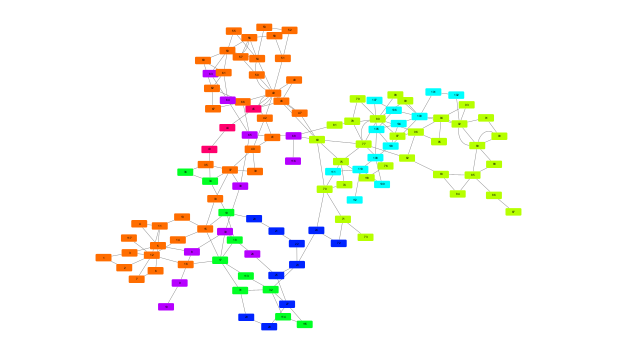

In [52]:
p4c.notebook_export_show_image()

A good thing of Moduland is that it allow us to visualize the communities as a network, and seems to recognize the most important edge of each community (It seems to be the criteria here is the betweenness of the nodes). It is helpful because it could be a criteria to decide the location of a microgrid.

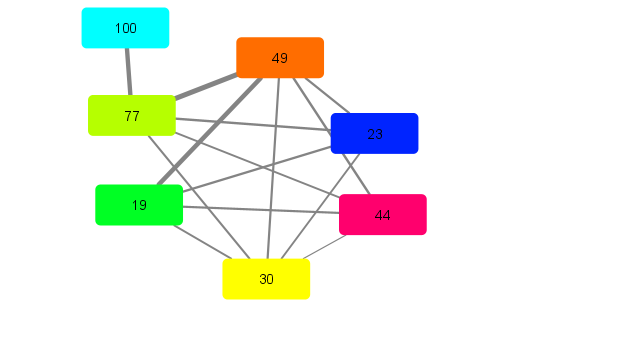

In [53]:
p4c.notebook_export_show_image()

Now we could simply change the network's layer to visualize it in a pretty way. For example, changing the node size proportional to its betweenness and the edge width proportional to its edge betweenness. The layout is the yFiles Orthogonal Layout.

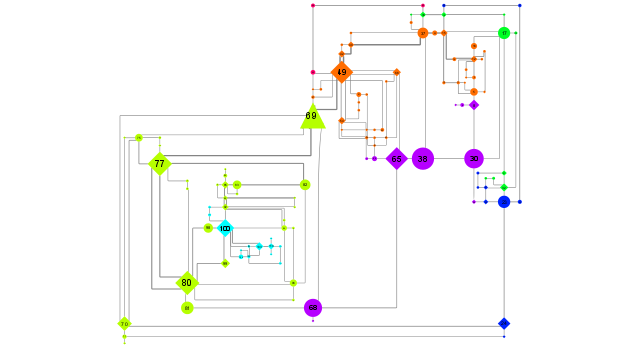

In [54]:
p4c.notebook_export_show_image()